In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
img1  = cv2.imread('dog_backpack.jpg')
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread('watermark_no_copy.png')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

(1401, 934, 3)

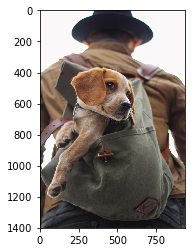

In [5]:
plt.imshow(img1)
img1.shape

In [33]:

img2.shape

(600, 600, 3)

In [9]:
img2 = cv2.resize(img2, (600,600))

In [20]:
x_offset = img1.shape[1] - img2.shape[1]
y_offset = img1.shape[0] - img2.shape[0]
x_end = img1.shape[1]
y_end = img1.shape[0]
print(x_offset,x_end,y_offset,y_end)

334 934 801 1401


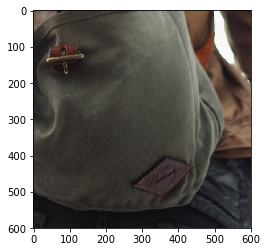

In [23]:
roi = img1[y_offset:y_end,x_offset:x_end]
plt.imshow(roi)

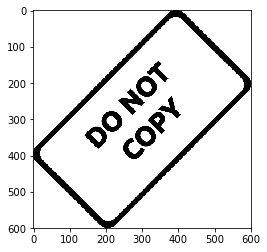

In [30]:
gray_img2 = cv2.imread('watermark_no_copy.png',0)
gray_img2 = cv2.resize(gray_img2 , (600,600))
plt.imshow(gray_img2 , cmap = 'gray')

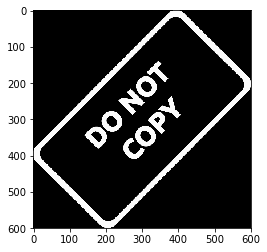

In [31]:
gray_img2_inv = cv2.bitwise_not(gray_img2)
plt.imshow(gray_img2_inv, cmap= 'gray')

In [32]:
gray_img2_inv.shape

(600, 600)

In [34]:
white_bg = np.full(img2.shape,255,dtype = np.uint8)

In [35]:
bk = cv2.bitwise_or(white_bg,white_bg,mask = gray_img2_inv)

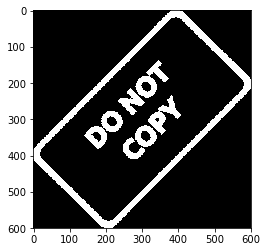

In [38]:
plt.imshow(bk)

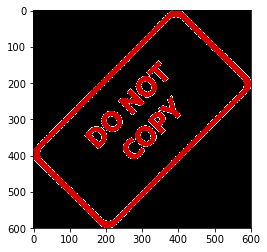

In [40]:
fg = cv2.bitwise_or(img2,img2,mask = gray_img2_inv)
plt.imshow(fg)

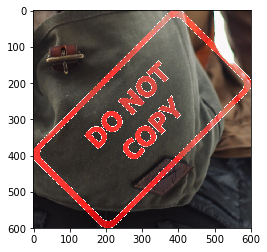

In [42]:
final_roi = cv2.bitwise_or(roi , fg )
plt.imshow(final_roi)

In [43]:
img1[y_offset:y_end,x_offset:x_end] = final_roi

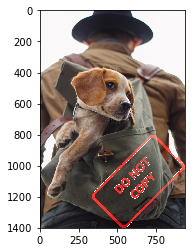

In [44]:
plt.imshow(img1)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
def readImage():
    img  = cv2.imread('rainbow.jpg',0)
    return img
def showImage(img):
    plt.imshow(img,cmap = 'gray')    

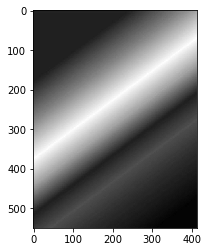

In [9]:
img = readImage()
showImage(img)

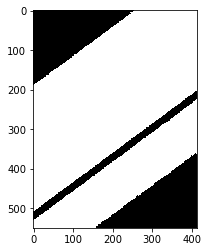

In [15]:
ret , th1 = cv2.threshold(img, int((img.max())/2),img.max(),cv2.THRESH_BINARY)
showImage(th1)

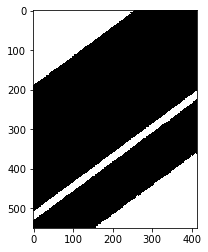

In [16]:
ret , th1 = cv2.threshold(img , int(img.max()/2),img.max(),cv2.THRESH_BINARY_INV)
showImage(th1)

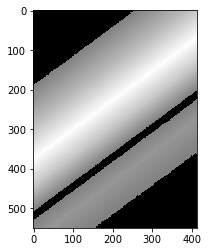

In [18]:
ret , th1 = cv2.threshold(img , int(img.max()/2),img.max(),cv2.THRESH_TOZERO)
showImage(th1)

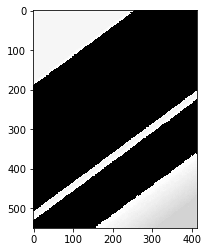

In [19]:
ret , th1 = cv2.threshold(img , int(img.max()/2),img.max(),cv2.THRESH_TOZERO_INV)
showImage(th1)

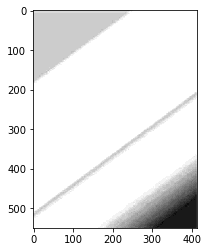

In [20]:
ret , th1 = cv2.threshold(img , int(img.max()/2),img.max(),cv2.THRESH_TRUNC)
showImage(th1)

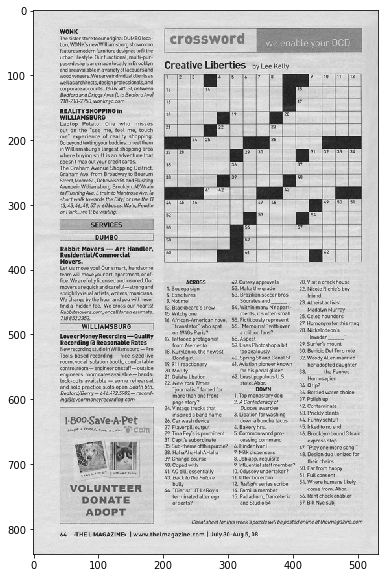

In [41]:
img1 = cv2.imread('crossword.jpg',0)
# plt.imshow(img,cmap = 'gray')
showImage(img1)

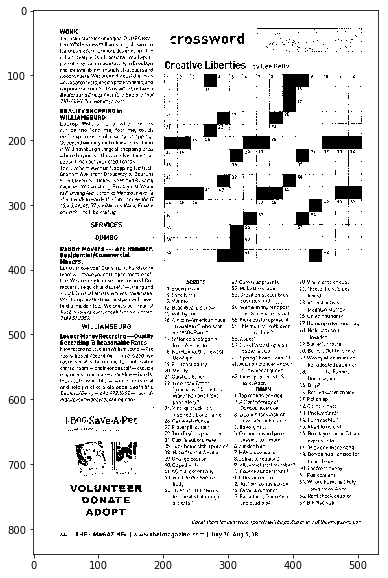

In [50]:
ret, th1 = cv2.threshold(img1,img1.max()/2,img1.max(),cv2.THRESH_BINARY)
showImage(th1)

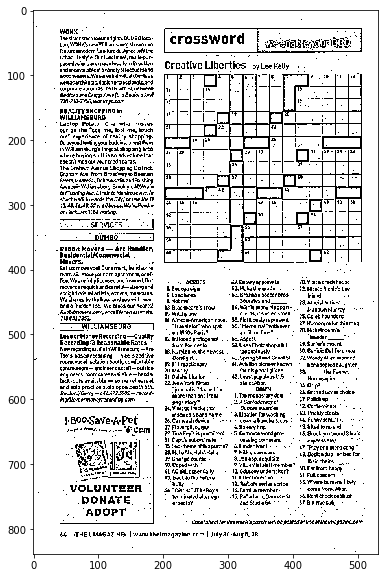

In [44]:
th2 = cv2.adaptiveThreshold(img1,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,7,10)
showImage(th2)

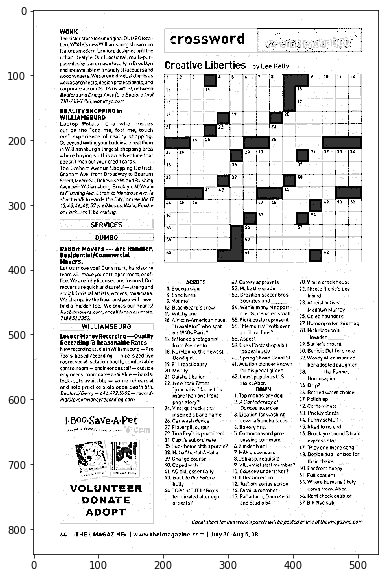

In [57]:
final_th = cv2.addWeighted(th1, 0.8 , th2, 0.2,0)
showImage(final_th)

In [58]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [59]:
def loadImage():
    img = cv2.imread('bricks.jpg')
    img  = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    return img
def showImage(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap = 'gray')

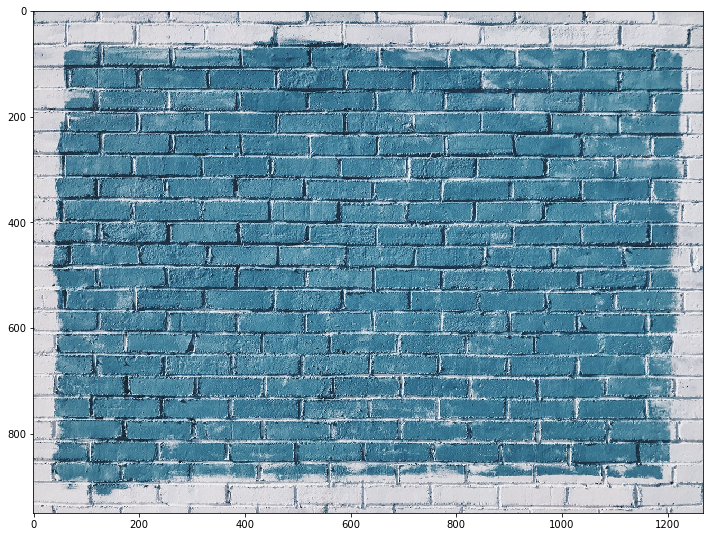

In [60]:
img = loadImage()
showImage(img)

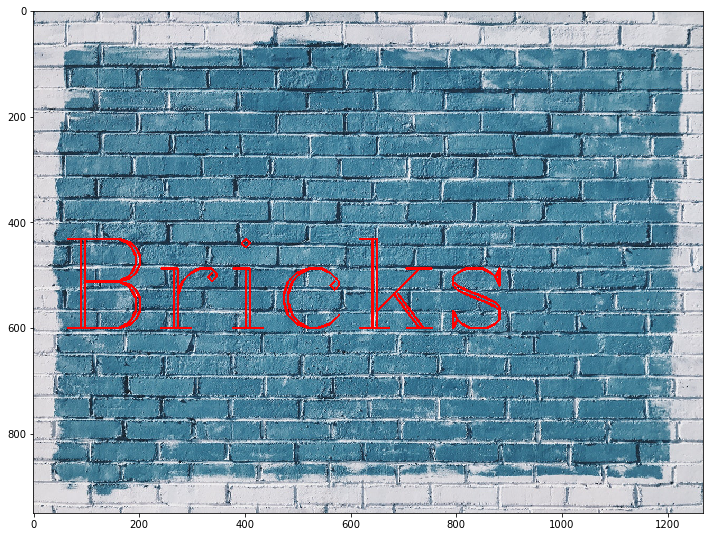

In [61]:
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,'Bricks',(50,600),font,8,(255,0,0),4)
showImage(img)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def loadImg():
    img = cv2.cvtColor(cv2.imread('bricks.jpg'),cv2.COLOR_BGR2RGB)
    return img

def displayImg(img):
    fig = plt.figure(figsize=(12,15))
    ax = fig.add_subplot(111)
    ax.imshow(img)
    

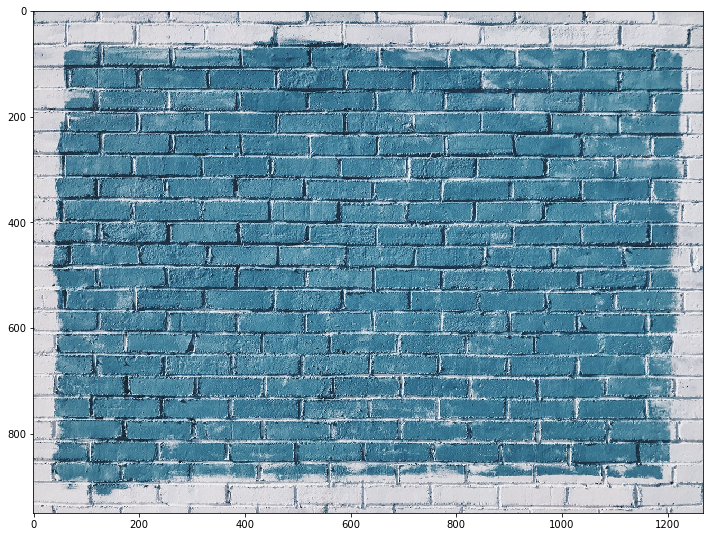

In [8]:
img = loadImg()
displayImg(img)

In [24]:
def putText(a,img):
    font = cv2.FONT_HERSHEY_COMPLEX
    cv2.putText(img,a,(50,600),font,10,(255,0,0),4)

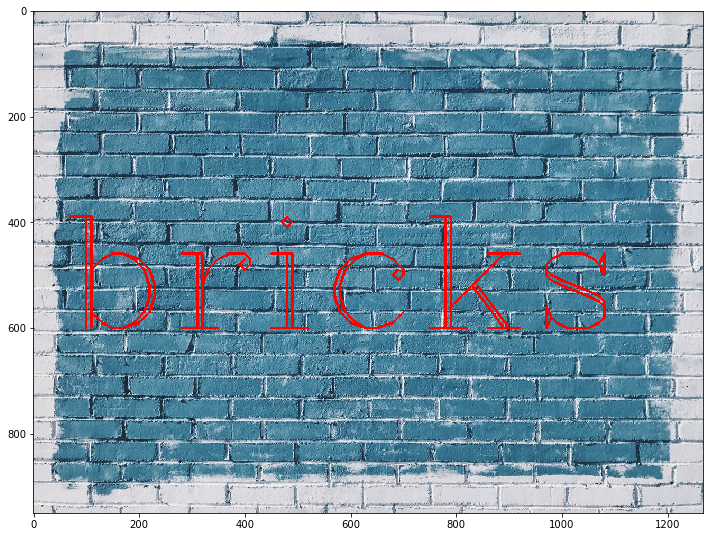

In [25]:
img = loadImg()
putText("bricks",img)
displayImg(img)

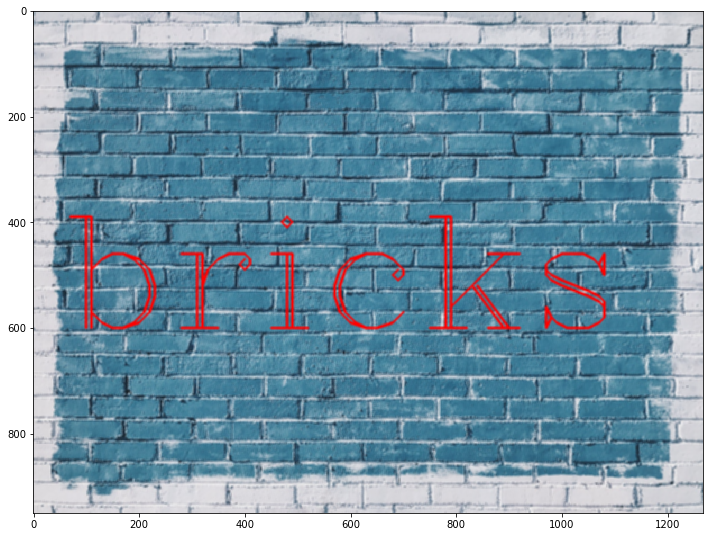

In [26]:
kernel = np.ones((5,5),dtype = np.float32)/25
dst = cv2.filter2D(img,-1,kernel)
displayImg(dst)

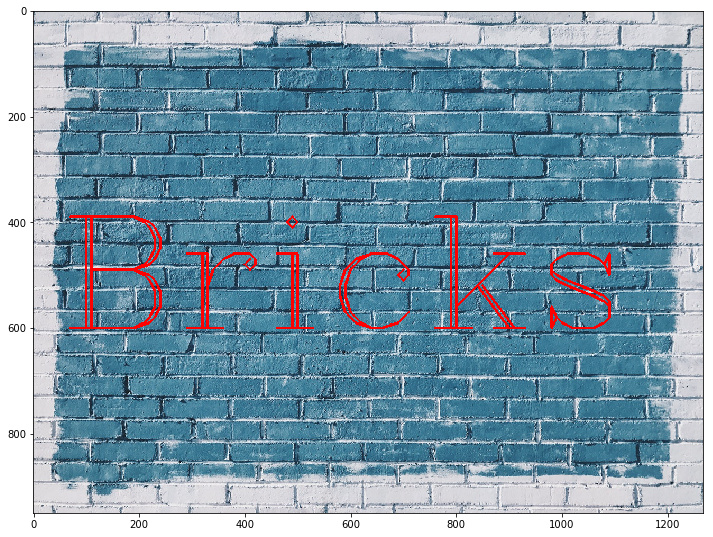

In [27]:
img = loadImg()
putText('Bricks',img)
displayImg(img)

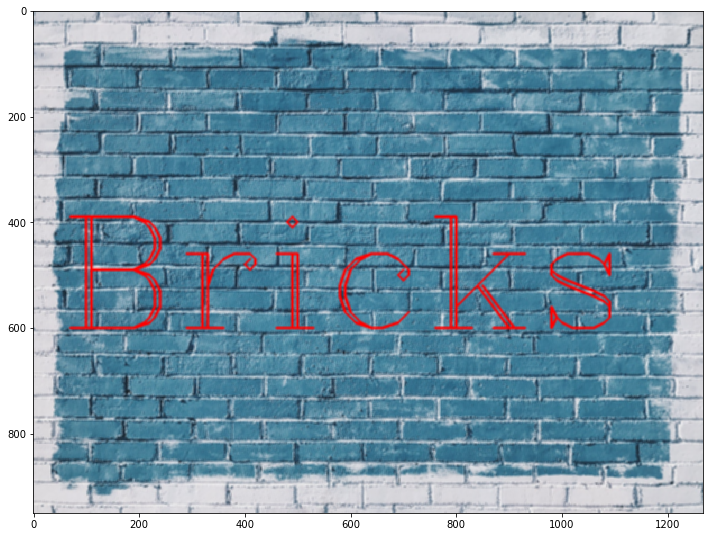

In [28]:
img = loadImg()
putText('Bricks',img)
blurred = cv2.blur(img , ksize=(5,5) )
displayImg(blurred)

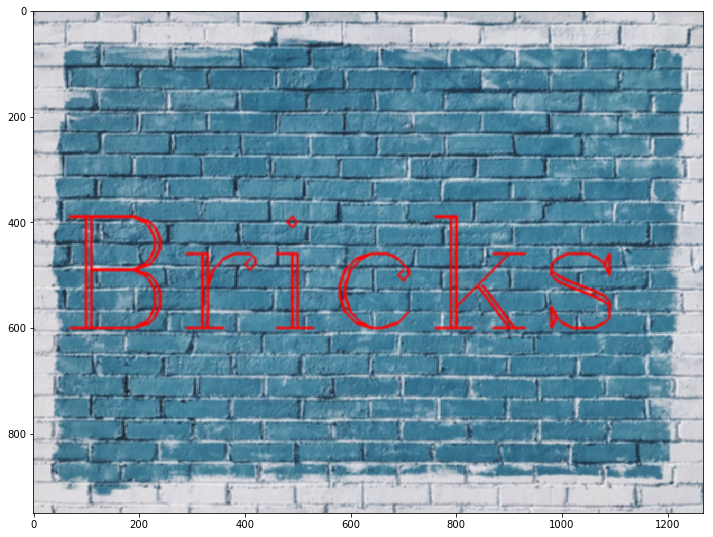

In [40]:
g_blur = cv2.GaussianBlur(img,(5,5), 10)
displayImg(g_blur)

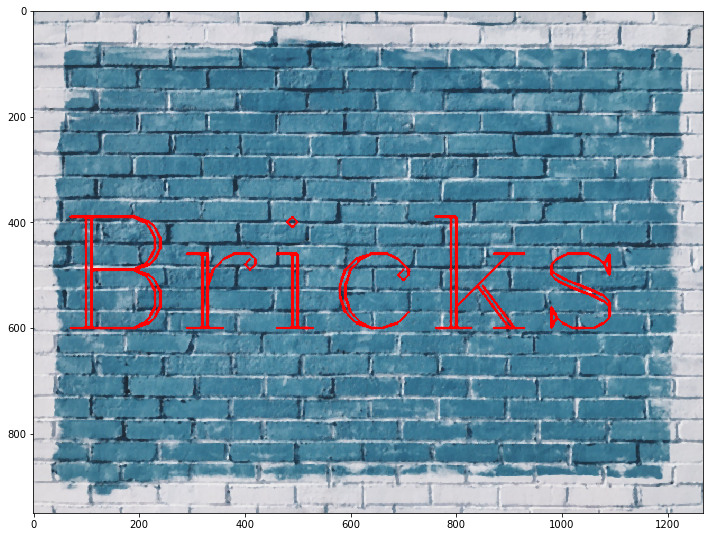

In [43]:
m_blur = cv2.medianBlur(img,5)
displayImg(m_blur)